# All about London's AirBnB scene

Let's say that I'm working for a rental property investor who is looking to enter the London Airbnb market. They would like to know what kind of property they should be looking at purchasing, where in London to look for this property, and roughly how much they can earn from the property. After they see these findings, the logical next step would be to see house purchase prices in the ideal area and determine whether it's worth their investment.

I'll be using AirBnB data for the city of London to answer a few questions related to London's AirBnB market. 

Questions to answer:
1. What is London's most expensive AirBnB rental area (borough)?
2. Do visitors prefer to hire the entire house/apartment or a single room?
3. Which area in London has the best AirBnB ratings?
4. Which London boroughs are most popular for Airbnb listings?
5. Can we predict a London AirBnB listing price?

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from pathlib import Path
import matplotlib.pylab as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.colors import n_colors
import plotly.express as px

%matplotlib inline
sns.set_context("paper", font_scale = 2)
sns.axes_style({ 'xtick.direction': 'out', 'ytick.direction': 'out',})
sns.set_style("darkgrid")

## Load data
There are 7 files that we have available. Three are fairly large and contain detailed data while two are summaries and AirBnB suggests to use them for visualisation purposes.

Files:
* `calendar.csv` : Detailed Calendar Data. Size: 1003 Mb.
* `listings.csv` : Detailed Listings data. Size: 150 Mb.
* `reviews.csv` : Detailed Review Data. Size: 307 Mb.
* `listings_summary.csv` : Summary information and metrics for listings in London (good for visualisations). Size: 8.9 Mb.
* `reviews_summary.csv` : Summary Review data and Listing ID (to facilitate time based analytics and visualisations linked to a listing). Size: 20 Mb.
* `neighbourhoods.csv` : Neighbourhood list for geo filter. Sourced from city or open source GIS files. Size: 1 Kb.
* `neighbourhoods.geojson` : GeoJSON file of neighbourhoods of the city. Size: 1 Mb.


[Airbnb's data assumptions](http://insideairbnb.com/data-assumptions).

To answer the first two questions we probably only need some summary and neighbourhood data. So I'll focus on this first before loading in the larger, more text-based, review data sets.

In [2]:
def load_csv_data(file_path: Path) -> pd.DataFrame:
    """
        Use Pandas to load a CSV file
    """
    if file_path.exists():
        df = pd.read_csv(file_path)
        return df
    else:
        raise FileNotFoundError(f"The file at path {str(file_path)} does not exist. Have you got the correct path?")
    

def print_column_details(df: pd.DataFrame) -> None:
    print(f"There are {len(df.columns)} columns titled:\n {list(df.columns)}.")
    

def get_nan_columns(df):
    nan_cols = []
    for col in df.columns:
        if df[col].isna().all():
            nan_cols.append(col)
    return nan_cols

In [3]:
DATA_DIR = Path("data")

listings_df = load_csv_data(Path(DATA_DIR / "listings.csv"))
listings_summary_df = load_csv_data(Path(DATA_DIR / "listings_summary.csv"))
neighbourhoods_gdf = gpd.read_file(Path(DATA_DIR / "neighbourhoods.geojson"))

## Let's have a quick look at what data we have

In [4]:
print_column_details(listings_df)

There are 74 columns titled:
 ['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availabi

In [5]:
listings_df.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,13913,https://www.airbnb.com/rooms/13913,20211207182339,2021-12-09,Holiday London DB Room Let-on going,My bright double bedroom with a large window h...,Finsbury Park is a friendly melting pot commun...,https://a0.muscache.com/pictures/miso/Hosting-...,54730,https://www.airbnb.com/users/show/54730,...,4.90,4.65,4.75,NaN,f,2,1,1,0,0.16
1,15400,https://www.airbnb.com/rooms/15400,20211207182339,2021-12-09,Bright Chelsea Apartment. Chelsea!,Lots of windows and light. St Luke's Gardens ...,It is Chelsea.,https://a0.muscache.com/pictures/428392/462d26...,60302,https://www.airbnb.com/users/show/60302,...,4.82,4.93,4.73,NaN,f,1,1,0,0,0.61
2,17402,https://www.airbnb.com/rooms/17402,20211207182339,2021-12-09,Superb 3-Bed/2 Bath & Wifi: Trendy W1,You'll have a wonderful stay in this superb mo...,"Location, location, location! You won't find b...",https://a0.muscache.com/pictures/39d5309d-fba7...,67564,https://www.airbnb.com/users/show/67564,...,4.66,4.85,4.59,NaN,f,1,1,0,0,0.33
3,17506,https://www.airbnb.com/rooms/17506,20211207182339,2021-12-09,Boutique Chelsea/Fulham Double bed 5-star ensuite,Enjoy a chic stay in this elegant but fully mo...,Fulham is 'villagey' and residential – a real ...,https://a0.muscache.com/pictures/11901327/e63d...,67915,https://www.airbnb.com/users/show/67915,...,NaN,NaN,NaN,NaN,f,2,0,2,0,NaN
4,25123,https://www.airbnb.com/rooms/25123,20211207182339,2021-12-09,Clean big Room in London (Room 1),Big room with double bed/ clean sheets/ clean ...,Barnet is one of the largest boroughs in Londo...,https://a0.muscache.com/pictures/456905/a004b9...,103583,https://www.airbnb.com/users/show/103583,...,4.89,4.45,4.74,NaN,t,3,0,3,0,0.91


In [6]:
listings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66641 entries, 0 to 66640
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            66641 non-null  int64  
 1   listing_url                                   66641 non-null  object 
 2   scrape_id                                     66641 non-null  int64  
 3   last_scraped                                  66641 non-null  object 
 4   name                                          66617 non-null  object 
 5   description                                   64297 non-null  object 
 6   neighborhood_overview                         39967 non-null  object 
 7   picture_url                                   66641 non-null  object 
 8   host_id                                       66641 non-null  int64  
 9   host_url                                      66641 non-null 

In [7]:
listings_summary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66641 entries, 0 to 66640
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              66641 non-null  int64  
 1   name                            66617 non-null  object 
 2   host_id                         66641 non-null  int64  
 3   host_name                       66582 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   66641 non-null  object 
 6   latitude                        66641 non-null  float64
 7   longitude                       66641 non-null  float64
 8   room_type                       66641 non-null  object 
 9   price                           66641 non-null  int64  
 10  minimum_nights                  66641 non-null  int64  
 11  number_of_reviews               66641 non-null  int64  
 12  last_review                     

In [8]:
neighbourhoods_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   neighbourhood        33 non-null     object  
 1   neighbourhood_group  0 non-null      object  
 2   geometry             33 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 920.0+ bytes


So looks like `neighbourhood_group` and `license` is full of `NaNs`. So we can probably get rid of those columns. Not sure what the `neighbourhood_group` stands for but London doesn't require Airbnb hosts to have a `license` so it makes sense why it would be full of NaNs.

We can check what other columns are completely full of `NaNs`.

In [9]:
listings_nans = get_nan_columns(listings_df)
listings_summary_nans = get_nan_columns(listings_summary_df)
neighbourhood_nans = get_nan_columns(neighbourhoods_gdf)

print(f"{listings_nans}")
print(f"{listings_summary_nans}")
print(f"{neighbourhood_nans}")

['neighbourhood_group_cleansed', 'bathrooms', 'calendar_updated', 'license']
['neighbourhood_group', 'license']
['neighbourhood_group']


### Starting off with by cleaning our Listings data

In [10]:
listings_df.drop(listings_nans, inplace=True, axis=1)

So unfortunately the price in `listings_df` is a string with the currency but what we want is the actual price as a float, so I'm going to copy the price from `listings_summary_df` over to `listings_df` and ensure that the unique id's match. 

In [11]:
temp_price = []
for i, row in listings_summary_df.iterrows():
    temp_price.append(float(row["price"]) if row["id"] == listings_df["id"].iloc[i] else None)

listings_df["price_numeric"] = temp_price

assert (listings_df[["id", "price_numeric"]].values == listings_summary_df[["id", "price"]].values).all() == True

Eventually, we're going to want to use price as our target variable and so having zero's or NaN's won't help us with that. So let's check if there are any of these

In [12]:
zero_price_df = listings_df[listings_df["price_numeric"] == 0]
print(f"We have {zero_price_df.shape[0]} rows where the price is 0.")

We have 23 rows where the price is 0.


So we got 23 rows where the price is zero and looking below looks like they are mostly `Hotel room` types. I think for now, probably best to remove them but noting that there might be a reason that I'm not aware about why these are listed as zero price. For the purposes of our brief described above I don't think we need to worry about hotel rooms anyway.

[Airbnb room types](https://www.airbnb.co.uk/help/article/5/types-of-places-to-stay?_set_bev_on_new_domain=1650714734_ZTYyNTk4MTIxZmNh)

Hotel rooms: Whether private or shared, hotel rooms provide a level of service and hospitality associated with traditional hotels. The rooms are available in boutique or lifestyle hotels, hostels, bed and breakfasts, or similar properties. They typically include vibrant common areas and rooms with unique touches.

How many rows have `NaNs` for price...

In [13]:
print(f"We have {np.sum(listings_df.price_numeric.isna())} rows that have NaN for price.")

We have 0 rows that have NaN for price.


So no `NaN`s in the prices which is nice! 

Let's drop all zero-priced rows.

In [14]:
listings_df = listings_df.drop(axis=0, index=zero_price_df.index)
assert listings_df["price_numeric"].min() > 0

### Let's look at the `neighbourhood_gdf` dataframe now...

In [15]:
neighbourhoods_gdf.drop(neighbourhood_nans, inplace=True, axis=1)
neighbourhoods_gdf = neighbourhoods_gdf.set_index("neighbourhood")

Note that `neighbourhood_cleansed` in `listings_df` is the same as `neighbourhood` in `listings_summary_df` as described in the [Airbnb data dictionary](https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=982310896).

We can check this below

In [16]:
assert set(listings_df["neighbourhood_cleansed"]) == set(listings_summary_df["neighbourhood"])

## What's London's most expensive Airbnb borough?

In the first instance, we'll investigate London's most expensive borough using summary statistics per borough to get an idea of what's going on

Let's add some summary statistics such as the mean, standard deviation, median, and mode of the prices to the `neighbourhood_gdf` DataFrame.

In [17]:
neighbourhoods_gdf["price_mean"] = listings_df.groupby("neighbourhood_cleansed")["price_numeric"].mean()
neighbourhoods_gdf["price_std"] = listings_df.groupby("neighbourhood_cleansed")["price_numeric"].std()
neighbourhoods_gdf["price_median"] = listings_df.groupby("neighbourhood_cleansed")["price_numeric"].median()
neighbourhoods_gdf["price_mode"] = listings_df.groupby("neighbourhood_cleansed")["price_numeric"].agg(pd.Series.mode)
neighbourhoods_gdf

,geometry,price_mean,price_std,price_median,price_mode
neighbourhood,,,,,
Kingston upon Thames,"MULTIPOLYGON (((-0.33068 51.32901, -0.33059 51...",107.432099,211.626277,65.0,40.0
Croydon,"MULTIPOLYGON (((-0.06402 51.31864, -0.06407 51...",63.727962,61.299781,46.0,30.0
Bromley,"MULTIPOLYGON (((0.01213 51.29960, 0.01196 51.2...",81.736264,100.745861,55.0,50.0
Hounslow,"MULTIPOLYGON (((-0.24456 51.48870, -0.24468 51...",97.941296,158.427751,60.0,40.0
Ealing,"MULTIPOLYGON (((-0.41183 51.53408, -0.41188 51...",95.908854,146.184421,59.0,50.0
Havering,"MULTIPOLYGON (((0.15869 51.51219, 0.15871 51.5...",93.758242,122.292322,56.0,30.0
Hillingdon,"MULTIPOLYGON (((-0.40407 51.61318, -0.40388 51...",89.877133,173.196352,51.0,45.0
Harrow,"MULTIPOLYGON (((-0.40407 51.61318, -0.40320 51...",81.739953,99.127609,53.0,30.0
Brent,"MULTIPOLYGON (((-0.19657 51.52765, -0.19685 51...",126.707709,283.138660,69.0,50.0


In [18]:
neighbourhoods_gdf["centre"] = neighbourhoods_gdf["geometry"].centroid;

/tmp/ipykernel_14565/2267409707.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  neighbourhoods_gdf["centre"] = neighbourhoods_gdf["geometry"].centroid;


Let's plot the mean price along with its standard deviation as a function of London neighbourhoods which are called Boroughs.

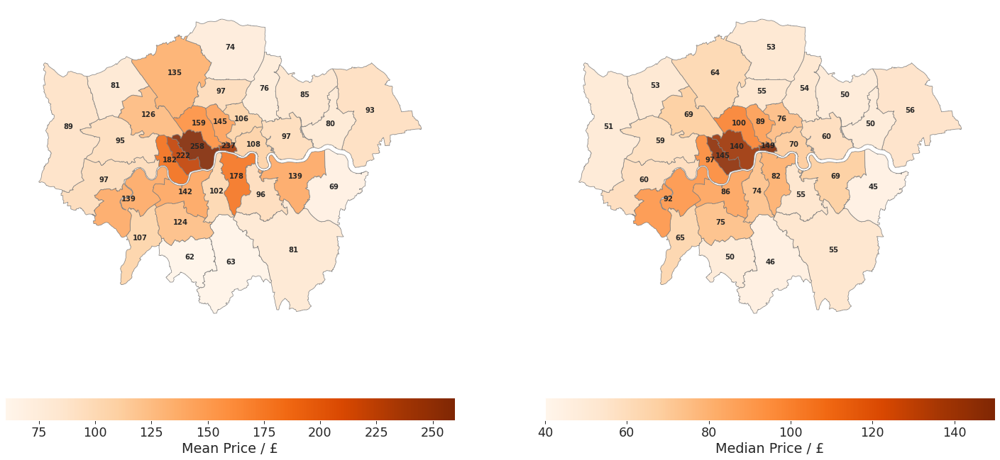

In [19]:
def plot_multiple_column_maps(df, column_list, cmap_label_list, cmap_roundoff=-1, annotate=True):
    """
        Plot multiple columns from a geoPandas DataFrame
    """

    n_cols = len(column_list)
    _, axes = plt.subplots(ncols=n_cols, figsize=(25, 12), sharey=True)
    for i, col in enumerate(column_list):
        df.plot(
            ax=axes[i],
            column=col, 
            figsize=(15, 12), 
            alpha=0.9, 
            edgecolor='grey', 
            legend=True, 
            cmap="Oranges",
            vmin=np.round(df[col].min(), cmap_roundoff),
            vmax=np.round(df[col].max(), cmap_roundoff),
            legend_kwds={'label': cmap_label_list[i], 'orientation': "horizontal"},
        );
        axes[i].set_axis_off();
        plt.margins(y=0)
        if annotate:
            for _, row in df.iterrows():
                axes[i].annotate(
                    text=int(row[col]), 
                    xy=(row["centre"].x,row["centre"].y), 
                    horizontalalignment='center', 
                    fontsize=10,
                    weight="bold",
                )    


plot_multiple_column_maps(neighbourhoods_gdf, ["price_mean", "price_median"], ["Mean Price / £", "Median Price / £"])

In [20]:
def print_topN_price(df, column_name, top_n=3):
    print(f"\nLondon's most expensive Airbnb boroughs, using {column_name}, are:")

    for i in range(top_n):
        print(f"\t{df[column_name].nlargest(top_n).index.to_numpy()[i]}: £ {np.round(df[column_name].nlargest(top_n).values[i], 0)} per night.")

print_topN_price(neighbourhoods_gdf, "price_mean")
print_topN_price(neighbourhoods_gdf, "price_median")


London's most expensive Airbnb boroughs, using price_mean, are:
	Westminster: £ 258.0 per night.
	City of London: £ 237.0 per night.
	Kensington and Chelsea: £ 222.0 per night.

London's most expensive Airbnb boroughs, using price_median, are:
	City of London: £ 149.0 per night.
	Kensington and Chelsea: £ 145.0 per night.
	Westminster: £ 140.0 per night.


So at first glance these maps answer the question we posed at the beginning of the notebook, "What is London's most expensive AirBnB rental area (borough)?", is **Westminister**.
But this is only true on average, or at least, it appears to be true on average with our current level of data exploration. The thing that has me a little concerned is the shear magnitude of the standard deviation. With the exception of a few boroughs, the standard deviations are larger than the corresponding means suggesting distributions with very heavy tails. 

Based on this I'd say this question warrants some more investigation. 

Let's have a look at plotting the distributions of prices as a function of London borough...

In [21]:
def plot_ridge_plot(df, column_name, xlabel, log_xvalue=False):

    n_boroughs = len(df["neighbourhood_cleansed"].unique())
    colors = n_colors('rgb(5, 200, 200)', 'rgb(200, 10, 10)', n_boroughs, colortype='rgb')

    fig = go.Figure()
    
    for borough, color in zip(set(df["neighbourhood_cleansed"].unique()), colors):
        if log_xvalue:
            x_value = np.log10(df[df["neighbourhood_cleansed"] == borough][column_name])
        else:
            x_value = df[df["neighbourhood_cleansed"] == borough][column_name]

        fig.add_trace(
            go.Violin(
                x=x_value, 
                line_color=color, 
                name=borough, 
                spanmode="soft",
            )
        )

    fig.update_traces(orientation='h', side='positive', width=3, points=False)
    fig.update_layout(xaxis_showgrid=False, xaxis_zeroline=False, width=1500, height=1200, xaxis_title=xlabel)
    fig.show()

plot_ridge_plot(listings_df, "price_numeric", "$Log_{10} Price / £$", True)

Above we see a ridge plot showing violin distributions of Airbnb listing prices for each London borough. The price is transformed by `log_10`. We can see that the prices range from a few tens of GBP to actually many thousands per night particularly for the more expensive boroughs.

After speaking our client and showing them the above figures we decided to confine our search further to maybe listings with less than three bedrooms and not look at anything too luxurious.

In [22]:
fig = px.choropleth_mapbox(neighbourhoods_gdf, geojson=neighbourhoods_gdf.geometry, color="price_mean",
                           locations=neighbourhoods_gdf.index, 
                           color_continuous_scale="Oranges",
                           opacity=0.5,
                           range_color=(np.round(neighbourhoods_gdf["price_mean"].min(), -1), np.round(neighbourhoods_gdf["price_mean"].max(), -1)),
                           center={"lat": listings_df["latitude"].mean(), "lon": listings_df["longitude"].mean()},
                           mapbox_style="carto-positron", zoom=8.5,
                           labels={"price_mean": "Mean Price"})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Which of London's boroughs have the best Airbnb ratings?

Again will be using summary statistics here.

In [23]:
review_cols = ["review_scores_rating", "review_scores_accuracy","review_scores_cleanliness", "review_scores_checkin",
    "review_scores_communication", "review_scores_location", "review_scores_value"]


listings_df[review_cols].describe()

,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
count,48073.000000,46755.000000,46766.000000,46716.000000,46752.000000,46715.000000,46712.000000
mean,4.540207,4.733489,4.622345,4.793005,4.807989,4.748034,4.636034
std,0.913820,0.509753,0.584204,0.473444,0.468095,0.426077,0.521482
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.500000,4.670000,4.500000,4.780000,4.810000,4.670000,4.500000
50%,4.810000,4.900000,4.820000,4.960000,5.000000,4.880000,4.770000
75%,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


Based on this it seems that we probably wont get much interesting information by looking at averaged ratings as they are all pretty high.

In [24]:
# Let's calculate average review ratings
for col in review_cols: 
    neighbourhoods_gdf[f"{col}_mean"] = listings_df.groupby("neighbourhood_cleansed")[col].mean()
    neighbourhoods_gdf[f"{col}_std"] = listings_df.groupby("neighbourhood_cleansed")[col].std()


In [25]:
neighbourhoods_gdf["reviews_mean"] = neighbourhoods_gdf.iloc[:,6::2].mean(axis=1)

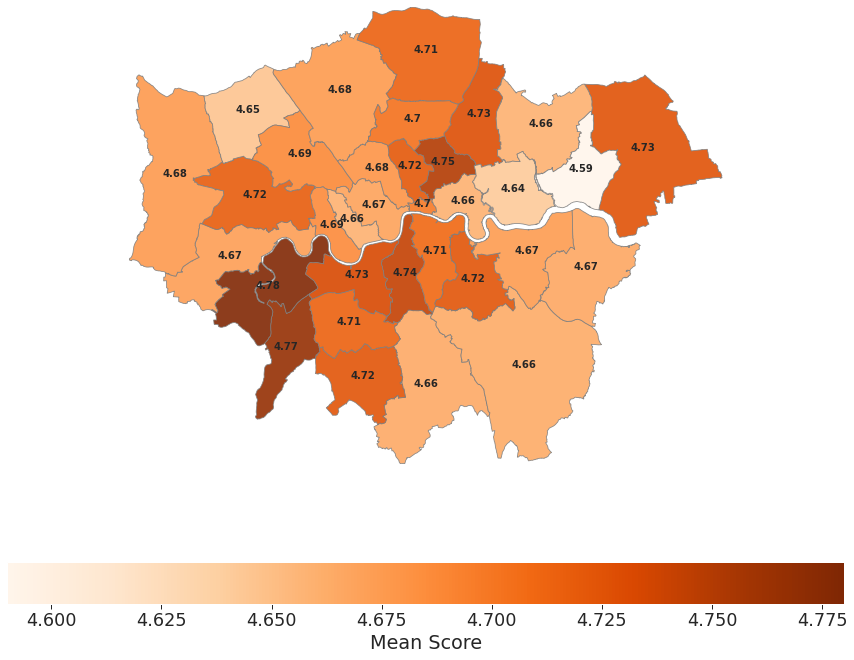

In [26]:
def plot_single_column_maps(df, column_name, cmap_label, roundoff=-1, annotate=True):
    """
        Plot multiple columns from a geoPandas DataFrame
    """

    _, axes = plt.subplots(ncols=1, figsize=(15, 12), sharey=True)

    df.plot(
        ax=axes,
        column=column_name, 
        figsize=(15, 12), 
        alpha=0.9, 
        edgecolor='grey', 
        legend=True, 
        cmap="Oranges",
        vmin=np.round(df[column_name].min(), roundoff),
        vmax=np.round(df[column_name].max(), roundoff),
        legend_kwds={'label': cmap_label, 'orientation': "horizontal"},
    );
    axes.set_axis_off();
    plt.margins(y=0)
    if annotate:
        for _, row in df.iterrows():
            axes.annotate(
                text=np.round(row[column_name], roundoff), 
                xy=(row["centre"].x,row["centre"].y), 
                horizontalalignment='center', 
                fontsize=10,
                weight="bold",
            )  

plot_single_column_maps(neighbourhoods_gdf, "reviews_mean", "Mean Score", 2)

In [27]:
def print_topN_rating(df, column_name, top_n=3):
    print(f"\nLondon's highest rated Airbnb boroughs, using {column_name}, are:")

    for i in range(top_n):
        print(f"\t{df[column_name].nlargest(top_n).index.to_numpy()[i]}: {np.round(df[column_name].nlargest(top_n).values[i], 2)}.")

print_topN_rating(neighbourhoods_gdf, "reviews_mean")


London's highest rated Airbnb boroughs, using reviews_mean, are:
	Richmond upon Thames: 4.78.
	Kingston upon Thames: 4.77.
	Hackney: 4.75.


In [28]:
plot_ridge_plot(listings_df, "review_scores_rating", "Review Scores Rating")

Grouping all of Airbnb's listings by borough we find that on average, London's three highest-rated boroughs, on average, are Richmond upon Thames, Kingston upon Thames, and Hackney. But As you can see in the ridge plot above most ratings are above 4/5 and on average they are all above 4.5 so I don't think there's much insight we can get from ratings without doing a deeper exploration which is out of the current scope.

## Which London boroughs are most popular for Airbnb listings?

As we don't have the number of times each listing has been hired, we're going to use the `number of reviews` as a proxy for this. We're assuming that, for the most part, if someone rents a listing, they'll leave a review and therefore listings without reviews have never been rented. This assumption is fairly strong but in the absense of data related to how many times each listing has been rented, we think this is a good subsitute.

In [29]:
neighbourhoods_gdf["number_of_reviews"] = listings_df.groupby("neighbourhood_cleansed")["number_of_reviews"].sum()
neighbourhoods_gdf["number_of_listings"] = listings_df.groupby("neighbourhood_cleansed")["id"].count()
neighbourhoods_gdf["number_of_reviews_norm_by_listings"] = listings_df.groupby("neighbourhood_cleansed")["number_of_reviews"].sum() / listings_df.groupby("neighbourhood_cleansed")["id"].count()
neighbourhoods_gdf[["number_of_reviews", "number_of_listings", "number_of_reviews_norm_by_listings"]].sort_values("number_of_reviews", ascending=False)

,number_of_reviews,number_of_listings,number_of_reviews_norm_by_listings
neighbourhood,,,
Westminster,129208,7015,18.418817
Camden,87729,4525,19.387624
Tower Hamlets,82847,5536,14.965137
Kensington and Chelsea,71333,4505,15.834184
Lambeth,71125,3725,19.093960
Islington,70445,3878,18.165291
Southwark,69975,3926,17.823484
Hackney,67215,5115,13.140762
Hammersmith and Fulham,49775,2953,16.855740


So based on the above we have `Westminister` as the borough with the most reviews but it also has many more listings than other boroughs, so if we normalise by the number of listings we see that the `City of London` actually has the most reviews and by proxy... the most popular with London's visitors using Airbnb.


Now lets have a look at how these figures change if we remove listings without any reviews.

In [30]:
listings_zero_revs = listings_df[listings_df["number_of_reviews"] != 0].copy()
assert listings_zero_revs.shape[0] != listings_df.shape[0]

In [31]:
neighbourhoods_gdf["number_of_reviews_zero_rev"] = listings_zero_revs.groupby("neighbourhood_cleansed")["number_of_reviews"].sum()
neighbourhoods_gdf["number_of_listings_zero_rev"] = listings_zero_revs.groupby("neighbourhood_cleansed")["id"].count()
neighbourhoods_gdf["number_of_reviews_norm_by_listings_zero_rev"] = listings_zero_revs.groupby("neighbourhood_cleansed")["number_of_reviews"].sum() / listings_zero_revs.groupby("neighbourhood_cleansed")["id"].count()

neighbourhoods_gdf[["number_of_listings_zero_rev", "number_of_listings_zero_rev", "number_of_reviews_norm_by_listings_zero_rev"]].sort_values("number_of_reviews_norm_by_listings_zero_rev", ascending=False)

,number_of_listings_zero_rev,number_of_listings_zero_rev,number_of_reviews_norm_by_listings_zero_rev
neighbourhood,,,
City of London,271,271,32.154982
Hillingdon,413,413,30.050847
Richmond upon Thames,761,761,27.274639
Camden,3385,3385,25.916987
Westminster,5102,5102,25.324971
Lambeth,2836,2836,25.079337
Islington,2895,2895,24.333333
Southwark,2933,2933,23.857825
Sutton,170,170,23.564706


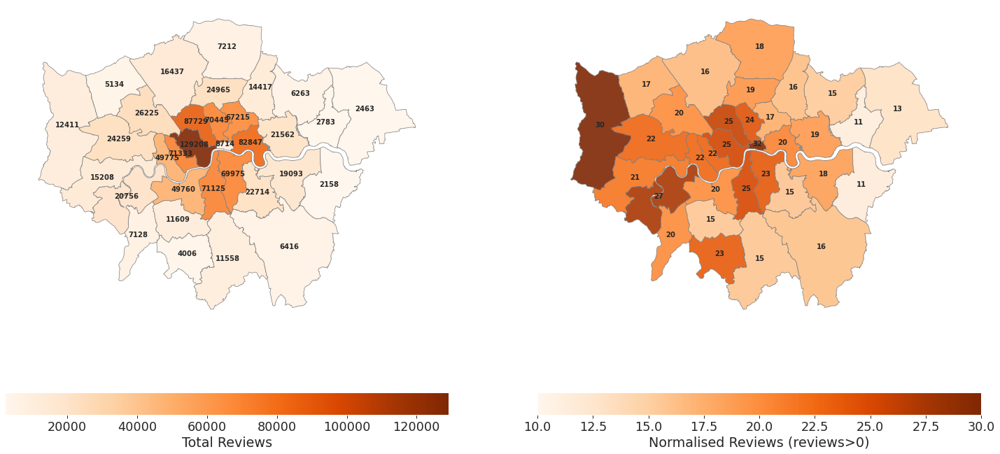

In [32]:
plot_multiple_column_maps(
    neighbourhoods_gdf, 
    ["number_of_reviews", "number_of_reviews_norm_by_listings_zero_rev"], 
    ["Total Reviews", "Normalised Reviews (reviews>0)"],
)

From the left-hand figure above we can gather a few insights (note that there are quite a few more in these plots... can you spot any?):

1. The majority of Airbnb reviews, and therefore rentals, are clustered in London's travel zones 1 and 2 comprising essentially of central London. The most popular being `Westminister`. This is unsurprising as most users of Airbnb will be visitors and therefore will want to be where there are a lot of amenities and attractions.

2. The `City of London`, right in the heart of London, has significantly fewer reviews than its surrounding central London boroughs. 

Looking at the normalised by active listings figure on the right, we see that the `City of London` is the most popular borough for Airbnb users with `Hillingdon` coming up at a close second. Both of these boroughs have a relatively small number of listings but are nonetheless popular. The `City of London` is popular as it lies in the heart of London while `Hillingdon` is probably popular with visitors wanting to stay close to London's Heathrow airport or potential students visiting Brunel University. 

## Do visitors prefer to hire the entire house/apartment or a single room?

In [33]:
# Percentage of room types
np.round(100*(listings_df["room_type"].value_counts() / listings_df.shape[0]),1)

Entire home/apt    56.2
Private room       42.6
Shared room         0.8
Hotel room          0.4
Name: room_type, dtype: float64

In [34]:
listings_df.groupby("room_type")["number_of_reviews"].sum().sort_values(ascending=False)

room_type
Private room       533689
Entire home/apt    498436
Shared room          6229
Hotel room           4549
Name: number_of_reviews, dtype: int64

In [35]:
listings_df["room_type"].value_counts()

Entire home/apt    37472
Private room       28400
Shared room          510
Hotel room           236
Name: room_type, dtype: int64

In [36]:
listings_df.groupby("room_type")["number_of_reviews"].sum() / listings_df["room_type"].value_counts()

Entire home/apt    13.301558
Hotel room         19.275424
Private room       18.791866
Shared room        12.213725
dtype: float64

## Can we predict the price of a London Airbnb listing?

Now we move on to the modelling part of this study. Saying that though, there's still some data cleaning to be done. 

We need to decide what to do with `NaN` values, categorical data, which features we should use, and whether any need transforming.

In [37]:
print_column_details(listings_df)

There are 71 columns titled:
 ['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'calendar_last_scraped', 'number_of

Let's pick out some column features that we think will be useful in predicting listing prices...

In [38]:
raw_features_cols = ["neighbourhood_cleansed", "latitude", "longitude", "property_type", "room_type", "accommodates", "bathrooms_text", "bedrooms", "beds", "price_numeric"]

In [39]:
listings_df[raw_features_cols].head()

,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,price_numeric
0,Islington,51.56861,-0.11270,Private room in rental unit,Private room,2,1 shared bath,1.0,NaN,65.0
1,Kensington and Chelsea,51.48780,-0.16813,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,75.0
2,Westminster,51.52195,-0.14094,Entire rental unit,Entire home/apt,6,2 baths,3.0,3.0,265.0
3,Hammersmith and Fulham,51.47935,-0.19743,Private room in townhouse,Private room,2,1 private bath,1.0,1.0,150.0
4,Barnet,51.57438,-0.21081,Private room in residential home,Private room,2,1.5 shared baths,1.0,NaN,29.0


So we haven't used `property_type` and `bathrooms_text` but we can see they are string based. Let's see how many unique values they have.

In [40]:
len(listings_df["property_type"].unique())

93

In [41]:
listings_df["property_type"].unique()[:10]

array(['Private room in rental unit', 'Entire rental unit',
       'Private room in townhouse', 'Private room in residential home',
       'Entire townhouse', 'Private room in condominium (condo)',
       'Room in serviced apartment', 'Entire condominium (condo)',
       'Entire serviced apartment', 'Room in aparthotel'], dtype=object)

I think we'll ignore `property_type` in the first instance.

In [42]:
len(listings_df["bathrooms_text"].unique())

47

In [43]:
listings_df["bathrooms_text"].unique()

array(['1 shared bath', '1 bath', '2 baths', '1 private bath',
       '1.5 shared baths', '1.5 baths', '0 shared baths', nan,
       '2.5 shared baths', '2 shared baths', '2.5 baths', '3 baths',
       '0 baths', 'Shared half-bath', '4 baths', '3 shared baths',
       '3.5 baths', 'Half-bath', '4.5 baths', '5 shared baths', '5 baths',
       '3.5 shared baths', 'Private half-bath', '7 baths',
       '4 shared baths', '6 shared baths', '6 baths', '5.5 baths',
       '10 baths', '8.5 shared baths', '6.5 baths', '8 shared baths',
       '17 baths', '7 shared baths', '7.5 baths', '10.5 baths',
       '4.5 shared baths', '12 baths', '9 baths', '8 baths', '16 baths',
       '6.5 shared baths', '10 shared baths', '5.5 shared baths',
       '16.5 baths', '21 shared baths', '12.5 baths'], dtype=object)

For `bathrooms_text` I think we can convert these to a numerical value along with whether the bathroom is private or not. 

I'm going to assume that if the `room_type` is the `Entire home/apt` then the bathroom is also private.


In [44]:
def get_bathroom_number(df, column_name):
    bathroom_number = []
    bathroom_private = []

    for idx, row in df.iterrows():
        if isinstance(row[column_name], float):
            if np.isnan(row[column_name]):
                bathroom_number.append(np.nan)
                bathroom_private.append(np.nan)
                continue

        if "private" in row[column_name].lower() or row["room_type"] == "Entire home/apt":
            bathroom_private.append(int(True))
        else:
            bathroom_private.append(int(False))

        if "half-bath" in row[column_name].lower():
            bathroom_number.append(0.5)
        else:
            bathroom_number.append(float(row[column_name].split(" ")[0]))
            
    return bathroom_number, bathroom_private

In [45]:
bath_num, bath_private = get_bathroom_number(listings_df[raw_features_cols], "bathrooms_text")

In [46]:
listings_modelling = listings_df[["neighbourhood_cleansed", "latitude", "longitude", "room_type", "accommodates", "bedrooms", "beds", "price_numeric"]].copy()

In [47]:
listings_modelling["bathrooms_number"] = bath_num
listings_modelling["bathrooms_private"] = bath_private

In [48]:
listings_modelling

,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bedrooms,beds,price_numeric,bathrooms_number,bathrooms_private
0,Islington,51.568610,-0.112700,Private room,2,1.0,NaN,65.0,1.0,0.0
1,Kensington and Chelsea,51.487800,-0.168130,Entire home/apt,2,1.0,1.0,75.0,1.0,1.0
2,Westminster,51.521950,-0.140940,Entire home/apt,6,3.0,3.0,265.0,2.0,1.0
3,Hammersmith and Fulham,51.479350,-0.197430,Private room,2,1.0,1.0,150.0,1.0,1.0
4,Barnet,51.574380,-0.210810,Private room,2,1.0,NaN,29.0,1.5,0.0
...,...,...,...,...,...,...,...,...,...,...
66636,Croydon,51.419345,-0.079681,Entire home/apt,6,3.0,3.0,120.0,1.0,1.0
66637,Ealing,51.502002,-0.276895,Entire home/apt,8,3.0,4.0,288.0,2.5,1.0
66638,Haringey,51.599308,-0.114763,Entire home/apt,4,2.0,1.0,104.0,2.0,1.0
66639,Kensington and Chelsea,51.510407,-0.193729,Entire home/apt,4,2.0,2.0,402.0,2.5,1.0


Let's have a look at the correlation with the numerical data we have so far

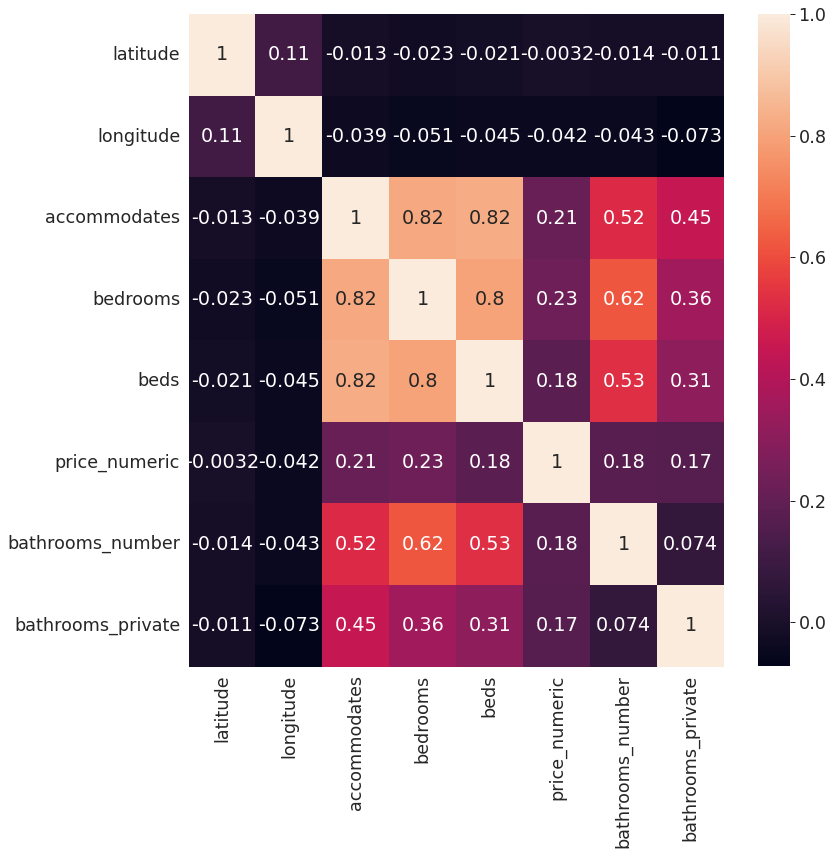

In [49]:
fig, ax = plt.subplots(figsize=(12,12));
sns.heatmap(listings_modelling.corr(), annot=True, ax=ax);

Now to deal with the Categorical data in `room_type`

we want to get proper column names for pd.get_dummies(), then get new feautures for room_types and neighbourhoods. 

Then we want to deal with NaN values

Then we can finally get to modelling!!